# Choices: distance (local basis), feature 2 (salt bridges), down-up transition 

In [ ]:
# import numpy as np
import extq
import matplotlib.pyplot as plt
import pyemma
import glob
import sys

In [2]:
sys.path.insert(1, "../python")
sys.path.insert(1, "../../")
import util
import kde

# Load feature 2 data (salt bridges)

In [3]:
with np.load("../data/raw_feat/feat2_raw.npz", allow_pickle=True) as f:
    data = f["arr_0"]

In [4]:
print(len(data))
print(data[0].shape)

1295
(3000, 60)


In [5]:
data_arr = np.concatenate(data)
print(data_arr.shape)

(6580000, 60)


Load CV data

In [6]:
with np.load("../data/raw_feat/cv_dist_spin.npz", allow_pickle=True) as f:
    cvs = f["arr_0"]

In [7]:
cvs.shape

(6580000, 2)

In [8]:
traj_lens = [len(traj) for traj in data]
traj_inds = []
subtot = 0
for length in traj_lens[:-1]:
    subtot += length
    traj_inds.append(subtot)

In [9]:
traj_inds[-10:]

[6480000,
 6490000,
 6500000,
 6510000,
 6520000,
 6530000,
 6540000,
 6550000,
 6560000,
 6570000]

In [10]:
cv_trajs = np.split(cvs, traj_inds)

# Define down and up states (see `cvs.ipynb` for histograms)

find crystal structure values for centers of ellipses

In [11]:
dist = cvs[:, 0]
rot = cvs[:, 1]

# ellipse centered at (-3.836 , -45.73) with radii 0.574 and 8.21 (1 sigma in each direction) for down state
down_ids = (
    (((dist + 3.836) / 0.574) ** 2 + ((rot + 45.73) / 8.21) ** 2) < 1
).nonzero()[0]

# ellipse centered at (-0.384, 3.78) with radii 0.460 and 2.9 for up state
up_ids = ((((dist + 0.384) / 0.460) ** 2 + ((rot - 3.78) / 2.9) ** 2) < 1).nonzero()[0]

mask = np.ones(len(cvs), dtype=bool)
mask[down_ids] = False
mask[up_ids] = False

# len(**_ids) is number of points in each state
down = data_arr[down_ids]
up = data_arr[up_ids]
other = data_arr[mask]
down_cvs = cvs[down_ids]
up_cvs = cvs[up_ids]
other_cvs = cvs[mask]

assert (len(down) + len(up) + len(other)) == len(cvs)
print(f"Number of down structures:   {len(down)}")
print(f"Number of up structures:     {len(up)}")
print(f"Number of other structures:  {len(other)}")

Number of down structures:   82403
Number of up structures:     80085
Number of other structures:  6417512


In [12]:
print(down.shape, up.shape, other.shape)
print(down_cvs.shape, up_cvs.shape, other_cvs.shape)

(82403, 60) (80085, 60) (6417512, 60)
(82403, 2) (80085, 2) (6417512, 2)


# Compute pairwise distances 

In [20]:
import sklearn.metrics as skl
import sklearn

print(sklearn.get_config()["working_memory"])

1024


In [21]:
# compute minimum distance (minimum of column) from domain to dimeric/monomeric state
def reduce_func(D_chunk, start):
    min2 = np.min(D_chunk, axis=1)
    return min2

## Down state

In [22]:
d_down = []
counter = 0.0
tot = len(data_arr)
skip = 3

for chunk in skl.pairwise_distances_chunked(
    data_arr, down[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_down.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.07% completed
0.15% completed
0.22% completed
0.30% completed
0.37% completed
0.45% completed
0.52% completed
0.59% completed
0.67% completed
0.74% completed
0.82% completed
0.89% completed
0.97% completed
1.04% completed
1.11% completed
1.19% completed
1.26% completed
1.34% completed
1.41% completed
1.49% completed
1.56% completed
1.63% completed
1.71% completed
1.78% completed
1.86% completed
1.93% completed
2.00% completed
2.08% completed
2.15% completed
2.23% completed
2.30% completed
2.38% completed
2.45% completed
2.52% completed
2.60% completed
2.67% completed
2.75% completed
2.82% completed
2.90% completed
2.97% completed
3.04% completed
3.12% completed
3.19% completed
3.27% completed
3.34% completed
3.42% completed
3.49% completed
3.56% completed
3.64% completed
3.71% completed
3.79% completed
3.86% completed
3.94% completed
4.01% completed
4.08% completed
4.16% completed
4.23% completed
4.31% completed
4.38% completed
4.46% completed
4.53% completed
4.60% completed
4.68% co

In [23]:
print(len(d_down), d_down[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_down_arr = np.reshape(np.concatenate(d_down), (-1, 1))
print(d_down_arr.shape)
print(np.max(d_down_arr[down_ids]))
d_down_arr[down_ids] = 0
print(np.max(d_down_arr[down_ids]))

print(d_down_arr.shape)

1347 (4886,)
(6580000, 1)
1.0814435
0.0
(6580000, 1)


In [25]:
np.save("../data/dist_down_feat2.npy", d_down_arr)

## Up state

In [30]:
d_up = []
counter = 0.0

for chunk in skl.pairwise_distances_chunked(
    data_arr, up[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.08% completed
0.15% completed
0.23% completed
0.31% completed
0.38% completed
0.46% completed
0.53% completed
0.61% completed
0.69% completed
0.76% completed
0.84% completed
0.92% completed
0.99% completed
1.07% completed
1.15% completed
1.22% completed
1.30% completed
1.38% completed
1.45% completed
1.53% completed
1.60% completed
1.68% completed
1.76% completed
1.83% completed
1.91% completed
1.99% completed
2.06% completed
2.14% completed
2.22% completed
2.29% completed
2.37% completed
2.44% completed
2.52% completed
2.60% completed
2.67% completed
2.75% completed
2.83% completed
2.90% completed
2.98% completed
3.06% completed
3.13% completed
3.21% completed
3.29% completed
3.36% completed
3.44% completed
3.51% completed
3.59% completed
3.67% completed
3.74% completed
3.82% completed
3.90% completed
3.97% completed
4.05% completed
4.13% completed
4.20% completed
4.28% completed
4.35% completed
4.43% completed
4.51% completed
4.58% completed
4.66% completed
4.74% completed
4.81% co

In [ ]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids]))
d_up_arr[up_ids] = 0
print(np.max(d_up_arr[up_ids]))

print(d_up_arr.shape)

1309 (5027,)
(6580000, 1)
1.0056884
0.0
(6580000, 1)


In [ ]:
np.save("../data/dist_up_feat2.npy", d_up_arr)

## Load distances 

In [13]:
d_down_arr = np.load("../data/feat2_local/dist_down_feat2.npy")
d_up_arr = np.load("../data/feat2_local/dist_up_feat2.npy")

## Smoothing functions and guess

In [14]:
# make smoothing function
smooth = (d_down_arr * d_up_arr) ** 0.5 / (d_down_arr + d_up_arr)

# make guess
guess_down = (d_up_arr / (d_down_arr + d_up_arr)) ** 2
guess_up = (d_down_arr / (d_down_arr + d_up_arr)) ** 2

# make smoothing 0 at boundaries (dimer and monomer states)
smooth[(mask == 0).flatten()] = 0
# ensure homogeneous boundary conditions for guess
guess_up[up_ids] = 1
guess_up[down_ids] = 0
guess_down[down_ids] = 1
guess_down[up_ids] = 0

In [76]:
np.save("../data/smooth_feat2.npy", smooth)
np.save("../data/guess_up_feat2.npy", guess_up)
np.save("../data/guess_down_feat2.npy", guess_down)

In [15]:
print(smooth.shape, guess_down.shape, guess_up.shape)

(6580000, 1) (6580000, 1) (6580000, 1)


In [16]:
%matplotlib inline

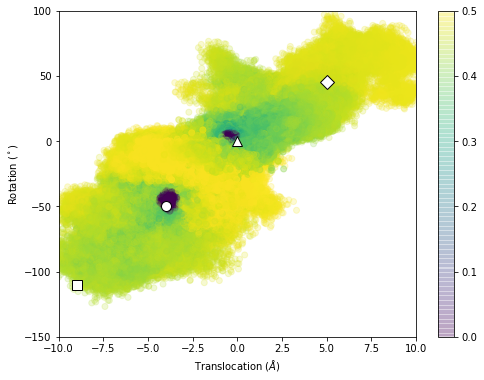

In [39]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(cvs[::10, 0], cvs[::10, 1], c=smooth[::10], alpha=0.2, cmap="viridis")
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

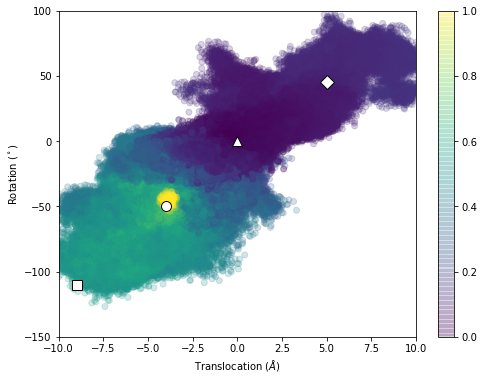

In [40]:
# Plot down state guess function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(
    cvs[::10, 0], cvs[::10, 1], c=guess_down[::10], alpha=0.2, cmap="viridis"
)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

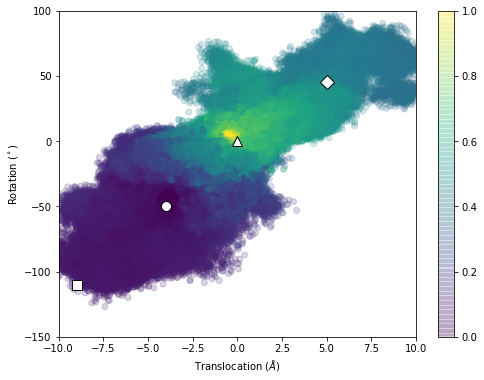

In [78]:
# Plot up state guess function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(cvs[::10, 0], cvs[::10, 1], c=guess_up[::10], alpha=0.2, cmap="viridis")
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

## Construct bases

In [17]:
def svd_whiten(X, n, frac_retain=1):
    U, L, V = np.linalg.svd(X, full_matrices=False)
    s = np.cumsum(L) / np.sum(L)
    n = np.where(s >= frac_retain)[0][0]
    return (U @ V)[:, 0:n], L

In [18]:
basis_smooth = smooth * data_arr
print(basis_smooth.shape)
basis_white, L = svd_whiten(basis_smooth, 1, frac_retain=0.75)
basis_white[(mask == 0).flatten()] = 0

(6580000, 60)


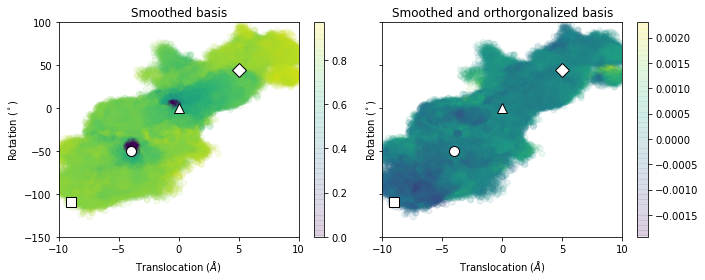

In [44]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    cvs[::10, 0],
    cvs[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="viridis",
)
h2 = ax2.scatter(
    cvs[::10, 0],
    cvs[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="viridis",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

In [79]:
np.save("../data/basis_white_feat2.npy", basis_white)
np.save("../data/guess_down_feat2.npy", guess_down)
np.save("../data/guess_up_feat2.npy", guess_up)

## Convert to lists of np arrays

In [28]:
const = np.ones((len(data_arr), 1))
basisL_arr = np.hstack((const, data_arr))
basisF_arr = basis_white

# basisL = np.split(basisL_arr, traj_inds)
basisL = np.split(data_arr, traj_inds)
basisF = np.split(basisF_arr, traj_inds)
guessU = np.split(np.squeeze(guess_up), traj_inds)
guessD = np.split(np.squeeze(guess_down), traj_inds)

print(len(basisL), basisL[0].shape)
print(len(basisF), basisF[0].shape)
print(len(guessU))
print(len(guessD))

1295 (3000, 60)
1295 (3000, 2)
1295
1295


In [20]:
print(basisF[0].shape)

(3000, 2)


In [21]:
print(guessU[0].shape)

(3000,)


# Change of Measure

In [22]:
# unit is 0.1 ps, up to 100 ns
lags = [1, 2, 5, 10, 20, 30, 40, 50, 100, 200, 300, 400, 500, 1000]

In [29]:
com_all = []
for lag in lags:
    com = extq.dga.reweight(data, lag)
    com_all.append(com)

In [31]:
np.save("../data/coms_feat2.npy", com_all)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


# PMF

In [67]:
import importlib

importlib.reload(extq)

<module 'extq' from '/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/__init__.py'>

In [30]:
pmf_all = []
dist_trajs = [traj[:, 0] for traj in cv_trajs]
rot_trajs = [traj[:, 1] for traj in cv_trajs]
xlim = np.linspace(-10, 10, 50)
ylim = np.linspace(-150, 100, 50)

for (com, lag) in zip(com_all, lags):
    print(f"PMF for lag {lag}")
    pmf_all.append(extq.projection.density2d(dist_trajs, rot_trajs, com, xlim, ylim))

PMF for lag 1
PMF for lag 2
PMF for lag 5
PMF for lag 10
PMF for lag 20
PMF for lag 30
PMF for lag 40
PMF for lag 50
PMF for lag 100
PMF for lag 200
PMF for lag 300
PMF for lag 400
PMF for lag 500
PMF for lag 1000


In [86]:
np.save("../data/pmfs_feat2.npy", pmf_all)

In [33]:
for dens in pmf_all:
    dens = dens / np.sum(dens)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in log
  
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: No contour levels were found within the data range.
  del sys.path[0]


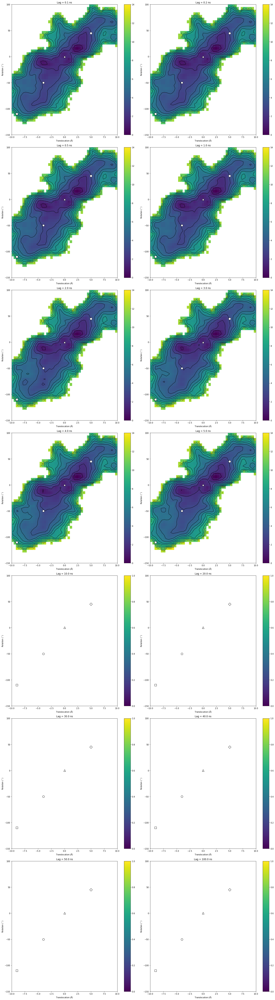

In [34]:
clines = np.linspace(0, 15, 16)
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2

f, axes = plt.subplots(7, 2, figsize=(20, 70))
for i, (lag, ax, pmf) in enumerate(zip(lags, axes.flat, pmf_all)):
    # calculate energy difference against minimum
    min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
    diff = -np.log(pmf.T) - min_energy
    h = ax.pcolor(xlim, ylim, diff, cmap="viridis", vmax=14)
    plt.colorbar(h, ax=ax)
    ax.contour(
        centerx,
        centery,
        diff,
        levels=clines,
        colors="black",
        linestyles="solid",
        linewidths=1,
    )
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()

# Committors

In [83]:
in_domain = np.split(mask, traj_inds)
q_downup, qb_downup, q_updown, qb_updown = [], [], [], []
for (lag, com) in zip(lags, com_all):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 30
Calculating committors for lag 40
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 300
Calculating committors for lag 400
Calculating committors for lag 500
Calculating committors for lag 1000


In [84]:
np.save("../data/q_du_feat2.npy", q_downup)
np.save("../data/qb_du_feat2.npy", qb_downup)
np.save("../data/q_ud_feat2.npy", q_updown)
np.save("../data/qb_ud_feat2.npy", qb_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [36]:
q_downup = np.load("../data/feat2_local/q_du_feat2.npy", allow_pickle=True)
qb_downup = np.load("../data/feat2_local/qb_du_feat2.npy", allow_pickle=True)
q_updown = np.load("../data/feat2_local/q_ud_feat2.npy", allow_pickle=True)
qb_updown = np.load("../data/feat2_local/qb_ud_feat2.npy", allow_pickle=True)

## Forward committor, down->up transition 

KDE estimate (issues due to the large amounts of "empty" space?)

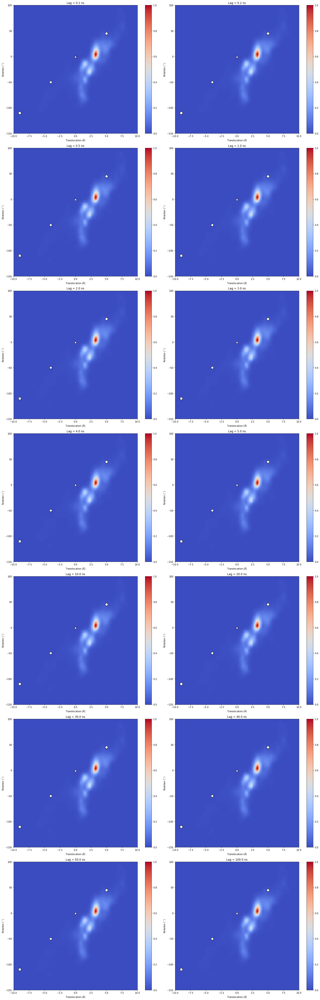

In [67]:
x = cvs[:, 0]
y = cvs[:, 1]

f, axs = plt.subplots(7, 2, figsize=(20, 60))

for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q)
    q_kde, xedges, yedges = kde.kdesum2d(
        x, y, q_arr, xmin=-10.0, xmax=10.0, ymin=-150.0, ymax=100.0, xstd=0.05, ystd=0.5
    )
    h = ax.pcolor(xedges, yedges, q_kde / np.max(q_kde), cmap="coolwarm")
    plt.colorbar(h, ax=ax)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()

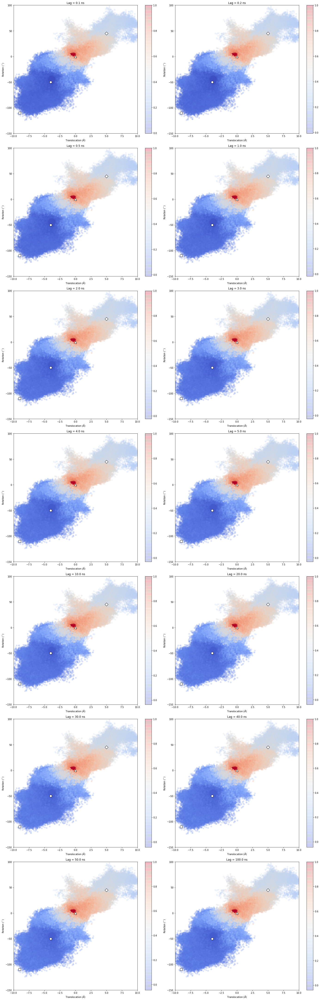

In [68]:
f, axs = plt.subplots(7, 2, figsize=(20, 60))
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q)
    h = ax.scatter(
        cvs[::20, 0], cvs[::20, 1], c=q_arr[::20], cmap="coolwarm", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()

In [51]:
np.concatenate(q_downup[0]).shape

(6580000,)

In [49]:
q_downup[0][0].shape

(3000,)

## Forward committor, up-> down transition 

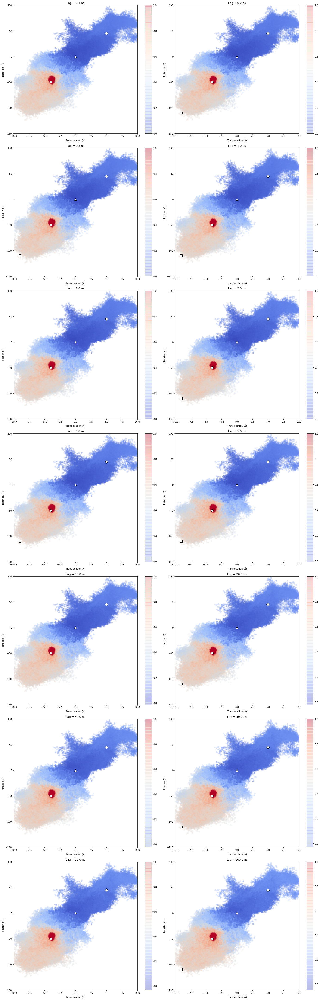

In [55]:
f, axs = plt.subplots(7, 2, figsize=(20, 60))
for lag, q, ax in zip(lags, q_updown, axs.flatten()):
    q_arr = np.concatenate(q)
    h = ax.scatter(
        cvs[::20, 0], cvs[::20, 1], c=q_arr[::20], cmap="coolwarm", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()

## Backward committor, down->up transition 

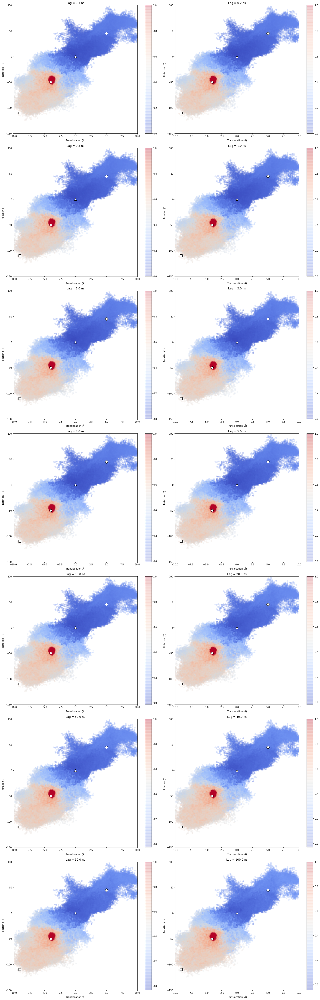

In [56]:
f, axs = plt.subplots(7, 2, figsize=(20, 60))
for lag, q, ax in zip(lags, qb_downup, axs.flatten()):
    q_arr = np.concatenate(q)
    h = ax.scatter(
        cvs[::20, 0], cvs[::20, 1], c=q_arr[::20], cmap="coolwarm", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()

## Backward committor, up->down transition 

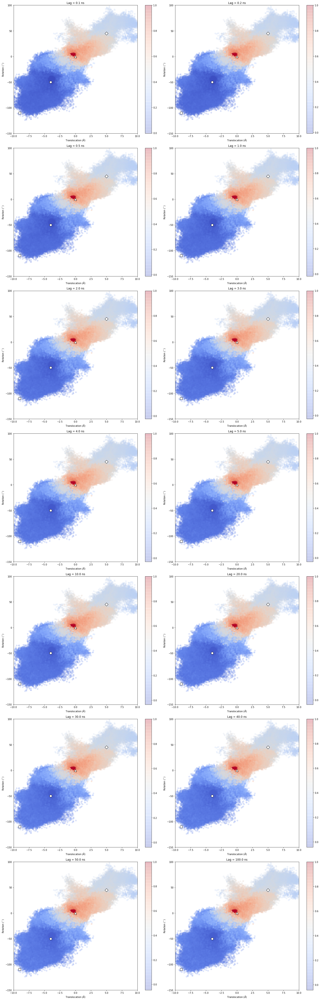

In [57]:
f, axs = plt.subplots(7, 2, figsize=(20, 60))
for lag, q, ax in zip(lags, qb_updown, axs.flatten()):
    q_arr = np.concatenate(q)
    h = ax.scatter(
        cvs[::20, 0], cvs[::20, 1], c=q_arr[::20], cmap="coolwarm", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()